In [2]:
import torch
import numpy as np
from torch.utils.data import Dataset
from pathlib import Path
from PIL import Image
import trimesh
from torchvision import transforms
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import random_split
import torchvision.models as models
from monai.losses import DiceLoss
from torchmetrics import JaccardIndex
from tqdm.notebook import tqdm


## Подготовка датасета

Конвертируем STL модели к воксельному виду

In [3]:
class VoxelReconstructionDataset(Dataset):
    def __init__(self, image_dir, mesh_dir, transform=None, voxel_size=32):
        self.image_dir = Path(image_dir)
        self.mesh_dir = Path(mesh_dir)
        self.filenames = [f.stem for f in self.image_dir.glob("*.png")]
        self.transform = transform
        self.voxel_size = voxel_size

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        name = self.filenames[idx]
        image = Image.open(self.image_dir / f"{name}.png").convert("RGB")
        if self.transform:
            image = self.transform(image)
        
        # загрузка и вокселизация STL
        mesh = trimesh.load_mesh(self.mesh_dir / f"{name}.stl")
        voxel = mesh.voxelized(pitch=mesh.scale / self.voxel_size).matrix
        voxel = torch.tensor(voxel.astype(np.float32)).unsqueeze(0)
        
        voxel = F.interpolate(voxel.unsqueeze(0), size=(self.voxel_size,)*3, mode='trilinear', align_corners=False).squeeze(0)
        
        return image, voxel


## Архитектуры

В данной работе рассматриваются обычные модели вида энкодер - декодер ввиду простоты их архитектуры

### Model 1

Самая простая модель, в энекодере используются обычные линейные слои

In [4]:
class ImageToVoxelNetV1(nn.Module):
    def __init__(self, voxel_dim=32):
        super().__init__()
        self.voxel_dim = voxel_dim

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),   # 1024 → 512
            nn.ReLU(),
            nn.BatchNorm2d(32), 

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # 512 → 256
            nn.ReLU(),
            nn.BatchNorm2d(64), 

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1), # 256 → 128
            nn.ReLU(),
            nn.BatchNorm2d(128), 

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),# 128 → 64
            nn.ReLU(),
            nn.BatchNorm2d(256), 

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),# 64 → 32
            nn.ReLU(),
            nn.BatchNorm2d(512), 

            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),# 32 → 16
            nn.ReLU(),
            nn.BatchNorm2d(512), 

            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),# 16 → 8
            nn.ReLU(),
            nn.BatchNorm2d(512), 

            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),# 8 → 4
            nn.ReLU(),
            nn.BatchNorm2d(512), 
        )


        self.fc = nn.Sequential(
            nn.Flatten(),                             # 512×4×4 = 8192
            nn.Linear(512 * 4 * 4, 2048),
            nn.ReLU(),
            nn.Linear(2048, voxel_dim ** 3),          
            nn.Sigmoid()
        )

    def forward(self, x):
        latent = self.encoder(x)
        voxels = self.fc(latent)
        return voxels.view(-1, 1, self.voxel_dim, self.voxel_dim, self.voxel_dim)

### Model 2

Используется энкодер из первой модели, однако в декодере используются ConvTranspose3d

In [12]:
class ImageToVoxelNetV2(nn.Module):
    def __init__(self, voxel_dim=32):
        super().__init__()
        self.voxel_dim = voxel_dim

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),  # 1024 → 512
            nn.ReLU(),
            nn.BatchNorm2d(32),

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # 512 → 256
            nn.ReLU(),
            nn.BatchNorm2d(64),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 256 → 128
            nn.ReLU(),
            nn.BatchNorm2d(128),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 128 → 64
            nn.ReLU(),
            nn.BatchNorm2d(256),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # 64 → 32
            nn.ReLU(),
            nn.BatchNorm2d(512),

            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),  # 32 → 16
            nn.ReLU(),
            nn.BatchNorm2d(512),

            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),  # 16 → 8
            nn.ReLU(),
            nn.BatchNorm2d(512),

            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),  # 8 → 4
            nn.ReLU(),
            nn.BatchNorm2d(512),
        )

        self.fc = nn.Sequential(
            nn.Flatten(),  # 512 × 4 × 4 = 8192
            nn.Linear(512 * 4 * 4, 2048),
            nn.ReLU(),
            nn.Linear(2048, 256 * 4 * 4 * 4),
            nn.ReLU()
        )

        self.dec = nn.Sequential(
            nn.ConvTranspose3d(256, 128, 4, stride=2, padding=1), # 4 → 8
            nn.ReLU(),
            nn.BatchNorm3d(128),

            nn.ConvTranspose3d(128, 64, 4, stride=2, padding=1), # 8 → 16
            nn.ReLU(),
            nn.BatchNorm3d(64),

            nn.ConvTranspose3d(64, 32, 4, stride=2, padding=1), # 16 → 32
            nn.ReLU(),
            nn.BatchNorm3d(32),

            nn.Conv3d(32, 1, kernel_size=1),
            nn.Sigmoid()

        )

    def forward(self, x):
        latent = self.encoder(x)
        bottleneck = self.fc(latent)
        x3d = bottleneck.view(-1, 256, 4, 4, 4)
        out = self.dec(x3d)

        return out


### Model 3

В этой модели добавляются skip-connections и dropout в декодере

In [17]:
class ImageToVoxelNetV3(nn.Module):
    def __init__(self, voxel_dim=32):
        super().__init__()
        self.voxel_dim = voxel_dim

        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),  # 1024 → 512
            nn.ReLU(),
            nn.BatchNorm2d(32),
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # 512 → 256
            nn.ReLU(),
            nn.BatchNorm2d(64),
        )
        self.enc3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 256 → 128
            nn.ReLU(),
            nn.BatchNorm2d(128),
        )
        self.enc4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 128 → 64
            nn.ReLU(),
            nn.BatchNorm2d(256),
        )
        self.enc5 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # 64 → 32
            nn.ReLU(),
            nn.BatchNorm2d(512),
        )
        self.enc6 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),  # 32 → 16
            nn.ReLU(),
            nn.BatchNorm2d(512),
        )
        self.enc7 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),  # 16 → 8
            nn.ReLU(),
            nn.BatchNorm2d(512),
        )
        self.enc8 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),  # 8 → 4
            nn.ReLU(),
            nn.BatchNorm2d(512),
        )

        self.fc = nn.Sequential(
            nn.Flatten(),  # 512 × 4 × 4 = 8192
            nn.Linear(512 * 4 * 4, 2048),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(2048, 256 * 4 * 4 * 4),
            nn.ReLU()
        )

        self.dec1 = nn.Sequential(
            nn.ConvTranspose3d(256, 128, 4, stride=2, padding=1), # 4 → 8
            nn.ReLU(),
            nn.BatchNorm3d(128),
        )
        self.dec2 = nn.Sequential(
            nn.ConvTranspose3d(128 + 128, 64, 4, stride=2, padding=1), # 8 → 16
            nn.BatchNorm3d(64),
            nn.ReLU(),
            nn.Dropout3d(0.2),
        )
        self.dec3 = nn.Sequential(
            nn.ConvTranspose3d(64 + 64, 32, 4, stride=2, padding=1), # 16 → 32
            nn.BatchNorm3d(32),
            nn.ReLU(),
            nn.Dropout3d(0.2)
        )

        self.final = nn.Sequential(
            nn.Conv3d(32, 1, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        e1 = self.enc1(x)  # 512
        e2 = self.enc2(e1)  # 256
        e3 = self.enc3(e2)  # 128
        e4 = self.enc4(e3)  # 64
        e5 = self.enc5(e4)  # 32
        e6 = self.enc6(e5)  # 16
        e7 = self.enc7(e6)  # 8
        e8 = self.enc8(e7)  # 4

        bottleneck = self.fc(e8)  # [B, 256*4*4*4]
        x3d = bottleneck.view(-1, 256, 4, 4, 4)

        d1 = self.dec1(x3d)  # [B, 128, 8, 8, 8]
        d1 = torch.cat([d1, self._project_2d_to_3d(e3, 8)], dim=1)

        d2 = self.dec2(d1)  # [B, 64, 16, 16, 16]
        d2 = torch.cat([d2, self._project_2d_to_3d(e2, 16)], dim=1)

        d3 = self.dec3(d2)  # [B, 32, 32, 32, 32]

        out = self.final(d3)  # [B, 1, 32, 32, 32]
        return out

    def _project_2d_to_3d(self, feat2d, target_size):
        up = F.interpolate(feat2d, size=(target_size, target_size), mode='bilinear', align_corners=False)
        proj3d = up.unsqueeze(2).expand(-1, -1, target_size, -1, -1)  # [B, C, D, H, W]
        return proj3d


### Model 4

В качестве энкодера используется ResNet18

In [7]:
class ImageToVoxelNetV4(nn.Module):
    def __init__(self, voxel_dim=32):
        super().__init__()
        self.voxel_dim = voxel_dim

        resnet = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        self.enc1 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu)  # [B, 64, 512, 512]
        self.enc2 = nn.Sequential(resnet.layer1)                          # [B, 64, 512, 512]
        self.enc3 = nn.Sequential(resnet.layer2)                          # [B, 128, 256, 256]
        self.enc4 = nn.Sequential(resnet.layer3)                          # [B, 256, 128, 128]
        self.enc5 = nn.Sequential(resnet.layer4)                          # [B, 512, 64, 64]

        self.fc = nn.Sequential(
            nn.AdaptiveAvgPool2d((4, 4)),
            nn.Flatten(),
            nn.Linear(512 * 4 * 4, 2048),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(2048, 256 * 4 * 4 * 4),
            nn.ReLU()
        )

        self.up1 = nn.Sequential(
            nn.ConvTranspose3d(256, 128, 4, stride=2, padding=1),
            nn.BatchNorm3d(128), nn.ReLU()
        )
        self.up2 = nn.Sequential(
            nn.ConvTranspose3d(128 + 128, 64, 4, stride=2, padding=1),
            nn.BatchNorm3d(64), nn.ReLU()
        )
        self.up3 = nn.Sequential(
            nn.ConvTranspose3d(64 + 64, 32, 4, stride=2, padding=1),
            nn.BatchNorm3d(32), nn.ReLU()
        )
        self.final = nn.Conv3d(32, 1, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(e1)
        e3 = self.enc3(e2)
        e4 = self.enc4(e3)
        e5 = self.enc5(e4)

        bottleneck = self.fc(e5)
        x3d = bottleneck.view(-1, 256, 4, 4, 4)

        d1 = self.up1(x3d)  # [B, 128, 8, 8, 8]
        d1 = torch.cat([d1, self._project_2d_to_3d(e3, 8)], dim=1)

        d2 = self.up2(d1)   # [B, 64, 16, 16, 16]
        d2 = torch.cat([d2, self._project_2d_to_3d(e2, 16)], dim=1)

        d3 = self.up3(d2)   # [B, 32, 32, 32, 32]

        out = self.final(d3)  # [B, 1, 32, 32, 32]
        return torch.sigmoid(out)

    def _project_2d_to_3d(self, feat2d, target_size):
        proj = F.interpolate(feat2d, size=(target_size, target_size), mode='bilinear', align_corners=False)
        proj3d = proj.unsqueeze(2).expand(-1, -1, target_size, -1, -1)  # [B,C,D,H,W]
        return proj3d


## Обучение моделей

In [8]:
def train_cycle(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    for img, vox in tqdm(dataloader):
        img, vox = img.to(device), vox.to(device)
        pred = model(img)
        loss = criterion(pred, vox)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(dataloader)

def validate(model, dataloader, criterion, device):
    iou_score = JaccardIndex(threshold=0.5, task="binary", average='none').to(device)
    model.eval()
    total_iou = 0
    total_loss = 0
    with torch.no_grad():
        for img, vox in tqdm(dataloader):
            img, vox = img.to(device), vox.to(device)
            pred = model(img)
            total_iou += iou_score(pred, vox.to(int))
            loss = criterion(pred, vox)
            total_loss += loss.item()
    return total_iou / len(dataloader), total_loss / len(dataloader)

def train(model, train_loader, val_loader, device, model_name):
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    criterion = DiceLoss(sigmoid=False)
    min_val_loss = float('inf')
    for epoch in range(15):
        loss = train_cycle(model, train_loader, optimizer, criterion, device)
        train_iou, _ = validate(model, train_loader, criterion, device)
        val_iou, val_loss = validate(model, val_loader, criterion, device)
        print(f"Epoch {epoch+1}: train_Loss={loss:.4f}, train_IoU={train_iou:.4f}, val_Loss={val_loss:.4f}, val_IoU={val_iou:.4f}")
        if val_loss < min_val_loss:
            min_val_loss = val_loss
            torch.save(model.state_dict(), f'best_{model_name}.pt')

    return loss, train_iou, val_iou, val_loss

In [9]:
# генератор с фиксированным seed
generator = torch.Generator().manual_seed(42)

transform = transforms.Compose([
    transforms.Resize((1024, 1024)),
    transforms.ToTensor()
])

dataset = VoxelReconstructionDataset("./dataset", "./dataset", transform)

val_ratio = 0.2
val_size = int(len(dataset) * val_ratio)
train_size = len(dataset) - val_size


# Воспроизводимое разделение
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=4, shuffle=False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [10]:
model_1 = ImageToVoxelNetV1(voxel_dim=32).to(device)
model_1_train_loss, model_1_train_iou, model_1_val_iou, model_1_val_loss = train(model_1, train_loader, val_loader, device, 'model_1')

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 1: train_Loss=0.5300, train_IoU=0.1485, val_Loss=0.4850, val_IoU=0.1459


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 2: train_Loss=0.4856, train_IoU=0.1645, val_Loss=0.4906, val_IoU=0.1631


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 3: train_Loss=0.4673, train_IoU=0.1377, val_Loss=0.5073, val_IoU=0.1343


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 4: train_Loss=0.4460, train_IoU=0.1829, val_Loss=0.4908, val_IoU=0.1762


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 5: train_Loss=0.4318, train_IoU=0.1860, val_Loss=0.4330, val_IoU=0.1802


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 6: train_Loss=0.4155, train_IoU=0.1871, val_Loss=0.4169, val_IoU=0.1798


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 7: train_Loss=0.4021, train_IoU=0.1963, val_Loss=0.4151, val_IoU=0.1843


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 8: train_Loss=0.3881, train_IoU=0.1858, val_Loss=0.4517, val_IoU=0.1812


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 9: train_Loss=0.3777, train_IoU=0.2052, val_Loss=0.4449, val_IoU=0.1942


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 10: train_Loss=0.3684, train_IoU=0.2074, val_Loss=0.4087, val_IoU=0.1917


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 11: train_Loss=0.3596, train_IoU=0.2143, val_Loss=0.4136, val_IoU=0.1946


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 12: train_Loss=0.3545, train_IoU=0.1968, val_Loss=0.4775, val_IoU=0.1874


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 13: train_Loss=0.3432, train_IoU=0.2165, val_Loss=0.3915, val_IoU=0.1958


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 14: train_Loss=0.3358, train_IoU=0.1976, val_Loss=0.5094, val_IoU=0.1874


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 15: train_Loss=0.3290, train_IoU=0.2244, val_Loss=0.3903, val_IoU=0.2010


На этом моменте произошло фиаско - я сохранял метрики не списком, поэтому отдельно собрал их из логов

In [24]:
model_1_train_loss = [
    0.5300, 0.4856, 0.4673, 0.4460, 0.4318,
    0.4155, 0.4021, 0.3881, 0.3777, 0.3684,
    0.3596, 0.3545, 0.3432, 0.3358, 0.3290
]
model_1_train_iou = [
    0.1485, 0.1645, 0.1377, 0.1829, 0.1860,
    0.1871, 0.1963, 0.1858, 0.2052, 0.2074,
    0.2143, 0.1968, 0.2165, 0.1976, 0.2244
]
model_1_val_iou = [
    0.1459, 0.1631, 0.1343, 0.1762, 0.1802,
    0.1798, 0.1843, 0.1812, 0.1942, 0.1917,
    0.1946, 0.1874, 0.1958, 0.1874, 0.2010
]
model_1_val_loss = [
    0.4850, 0.4906, 0.5073, 0.4908, 0.4330,
    0.4169, 0.4151, 0.4517, 0.4449, 0.4087,
    0.4136, 0.4775, 0.3915, 0.5094, 0.3903
]

In [13]:
model_2 = ImageToVoxelNetV2(voxel_dim=32).to(device)
model_2_train_loss, model_2_train_iou, model_2_val_iou, model_2_val_loss = train(model_2, train_loader, val_loader, device, 'model_2')

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 1: train_Loss=0.5489, train_IoU=0.1242, val_Loss=0.5071, val_IoU=0.1229


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 2: train_Loss=0.4780, train_IoU=0.1532, val_Loss=0.4658, val_IoU=0.1475


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 3: train_Loss=0.4374, train_IoU=0.1568, val_Loss=0.4406, val_IoU=0.1464


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 4: train_Loss=0.4141, train_IoU=0.1771, val_Loss=0.4105, val_IoU=0.1642


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 5: train_Loss=0.3897, train_IoU=0.1834, val_Loss=0.3982, val_IoU=0.1649


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 6: train_Loss=0.3713, train_IoU=0.1824, val_Loss=0.3907, val_IoU=0.1652


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 7: train_Loss=0.3588, train_IoU=0.1872, val_Loss=0.3917, val_IoU=0.1614


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 8: train_Loss=0.3431, train_IoU=0.1989, val_Loss=0.3912, val_IoU=0.1726


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 9: train_Loss=0.3262, train_IoU=0.2103, val_Loss=0.3827, val_IoU=0.1781


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 10: train_Loss=0.3124, train_IoU=0.2094, val_Loss=0.3819, val_IoU=0.1791


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 11: train_Loss=0.3024, train_IoU=0.2144, val_Loss=0.3787, val_IoU=0.1793


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 12: train_Loss=0.2914, train_IoU=0.2284, val_Loss=0.3875, val_IoU=0.1988


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 13: train_Loss=0.2777, train_IoU=0.2295, val_Loss=0.3793, val_IoU=0.1942


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 14: train_Loss=0.2648, train_IoU=0.2346, val_Loss=0.3767, val_IoU=0.1867


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 15: train_Loss=0.2542, train_IoU=0.2339, val_Loss=0.3749, val_IoU=0.1943


In [26]:
model_2_train_loss = [
    0.5489, 0.4780, 0.4374, 0.4141, 0.3897,
    0.3713, 0.3588, 0.3431, 0.3262, 0.3124,
    0.3024, 0.2914, 0.2777, 0.2648, 0.2542
]
model_2_train_iou = [
    0.1242, 0.1532, 0.1568, 0.1771, 0.1834,
    0.1824, 0.1872, 0.1989, 0.2103, 0.2094,
    0.2144, 0.2284, 0.2295, 0.2346, 0.2339
]
model_2_val_iou = [
    0.1229, 0.1475, 0.1464, 0.1642, 0.1649,
    0.1652, 0.1614, 0.1726, 0.1781, 0.1791,
    0.1793, 0.1988, 0.1942, 0.1867, 0.1943
]
model_2_val_loss = [
    0.5071, 0.4658, 0.4406, 0.4105, 0.3982,
    0.3907, 0.3917, 0.3912, 0.3827, 0.3819,
    0.3787, 0.3875, 0.3793, 0.3767, 0.3749
]

In [18]:
model_3 = ImageToVoxelNetV3(voxel_dim=32).to(device)
model_3_train_loss, model_3_train_iou, model_3_val_iou, model_3_val_loss = train(model_3, train_loader, val_loader, device, 'model_3')

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 1: train_Loss=0.5861, train_IoU=0.1512, val_Loss=0.5682, val_IoU=0.1474


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 2: train_Loss=0.5415, train_IoU=0.1633, val_Loss=0.5066, val_IoU=0.1553


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 3: train_Loss=0.4996, train_IoU=0.1666, val_Loss=0.4630, val_IoU=0.1615


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 4: train_Loss=0.4581, train_IoU=0.1723, val_Loss=0.4758, val_IoU=0.1665


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 5: train_Loss=0.4321, train_IoU=0.1855, val_Loss=0.4203, val_IoU=0.1738


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 6: train_Loss=0.4068, train_IoU=0.1973, val_Loss=0.4165, val_IoU=0.1805


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 7: train_Loss=0.3820, train_IoU=0.2029, val_Loss=0.4026, val_IoU=0.1817


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 8: train_Loss=0.3624, train_IoU=0.2080, val_Loss=0.3923, val_IoU=0.1847


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 9: train_Loss=0.3441, train_IoU=0.2143, val_Loss=0.3969, val_IoU=0.1859


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 10: train_Loss=0.3295, train_IoU=0.2167, val_Loss=0.3863, val_IoU=0.1889


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 11: train_Loss=0.3154, train_IoU=0.2111, val_Loss=0.3854, val_IoU=0.1792


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 12: train_Loss=0.3020, train_IoU=0.2295, val_Loss=0.3960, val_IoU=0.1973


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 13: train_Loss=0.2876, train_IoU=0.2336, val_Loss=0.3803, val_IoU=0.2016


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 14: train_Loss=0.2756, train_IoU=0.2334, val_Loss=0.3789, val_IoU=0.1952


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 15: train_Loss=0.2658, train_IoU=0.2329, val_Loss=0.3841, val_IoU=0.1965


In [25]:
model_3_train_loss = [
    0.5861, 0.5415, 0.4996, 0.4581, 0.4321, 
    0.4068, 0.3820, 0.3624, 0.3441, 0.3295, 
    0.3154, 0.3020, 0.2876, 0.2756, 0.2658
]
model_3_train_iou = [
    0.1512, 0.1633, 0.1666, 0.1723, 0.1855, 
    0.1973, 0.2029, 0.2080, 0.2143, 0.2167, 
    0.2111, 0.2295, 0.2336, 0.2334, 0.2329
]
model_3_val_iou = [
    0.1474, 0.1553, 0.1615, 0.1665, 0.1738, 
    0.1805, 0.1817, 0.1847, 0.1859, 0.1889, 
    0.1792, 0.1973, 0.2016, 0.1952, 0.1965
]
model_3_val_loss = [
    0.5682, 0.5066, 0.4630, 0.4758, 0.4203, 
    0.4165, 0.4026, 0.3923, 0.3969, 0.3863, 
    0.3854, 0.3960, 0.3803, 0.3789, 0.3841]

In [20]:
torch.cuda.empty_cache()

In [21]:
model_4 = ImageToVoxelNetV4(voxel_dim=32).to(device)
model_4_train_loss, model_4_train_iou, model_4_val_iou, model_4_val_loss = train(model_4, train_loader, val_loader, device, 'model_4')

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 1: train_Loss=0.5877, train_IoU=0.1296, val_Loss=0.5279, val_IoU=0.1265


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 2: train_Loss=0.5504, train_IoU=0.1593, val_Loss=0.5145, val_IoU=0.1606


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 3: train_Loss=0.5214, train_IoU=0.1513, val_Loss=0.4800, val_IoU=0.1547


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 4: train_Loss=0.5028, train_IoU=0.1731, val_Loss=0.4638, val_IoU=0.1746


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 5: train_Loss=0.4869, train_IoU=0.1604, val_Loss=0.4508, val_IoU=0.1599


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 6: train_Loss=0.4664, train_IoU=0.1649, val_Loss=0.4476, val_IoU=0.1624


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 7: train_Loss=0.4482, train_IoU=0.1450, val_Loss=0.4592, val_IoU=0.1424


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 8: train_Loss=0.4326, train_IoU=0.1752, val_Loss=0.4237, val_IoU=0.1648


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 9: train_Loss=0.4174, train_IoU=0.1725, val_Loss=0.4156, val_IoU=0.1592


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 10: train_Loss=0.4020, train_IoU=0.1784, val_Loss=0.4098, val_IoU=0.1653


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 11: train_Loss=0.3907, train_IoU=0.1866, val_Loss=0.3977, val_IoU=0.1710


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 12: train_Loss=0.3789, train_IoU=0.1806, val_Loss=0.3941, val_IoU=0.1643


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 13: train_Loss=0.3675, train_IoU=0.1870, val_Loss=0.3963, val_IoU=0.1703


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 14: train_Loss=0.3584, train_IoU=0.2033, val_Loss=0.3920, val_IoU=0.1875


  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/113 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Epoch 15: train_Loss=0.3515, train_IoU=0.2177, val_Loss=0.3788, val_IoU=0.1947


In [27]:
model_4_train_loss = [
    0.5877, 0.5504, 0.5214, 0.5028, 0.4869,
    0.4664, 0.4482, 0.4326, 0.4174, 0.4020,
    0.3907, 0.3789, 0.3675, 0.3584, 0.3515
]

model_4_train_iou = [
    0.1296, 0.1593, 0.1513, 0.1731, 0.1604,
    0.1649, 0.1450, 0.1752, 0.1725, 0.1784,
    0.1866, 0.1806, 0.1870, 0.2033, 0.2177
]

model_4_val_loss = [
    0.5279, 0.5145, 0.4800, 0.4638, 0.4508,
    0.4476, 0.4592, 0.4237, 0.4156, 0.4098,
    0.3977, 0.3941, 0.3963, 0.3920, 0.3788
]

model_4_val_iou = [
    0.1265, 0.1606, 0.1547, 0.1746, 0.1599,
    0.1624, 0.1424, 0.1648, 0.1592, 0.1653,
    0.1710, 0.1643, 0.1703, 0.1875, 0.1947
]

## Сравнение моделей

### Смотрим метрики

In [28]:
def results(model_1_train_loss, model_1_val_loss, model_1_train_iou, model_1_val_iou,
             model_2_train_loss, model_2_val_loss, model_2_train_iou, model_2_val_iou,
             model_3_train_loss, model_3_val_loss, model_3_train_iou, model_3_val_iou,
             model_4_train_loss, model_4_val_loss, model_4_train_iou, model_4_val_iou):
    
    epochs = range(len(model_1_train_loss))
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, model_1_train_loss, label='Model 1 Train Loss')
    plt.plot(epochs, model_1_val_loss, label='Model 1 Val Loss')
    plt.plot(epochs, model_2_train_loss, label='Model 2 Train Loss')
    plt.plot(epochs, model_2_val_loss, label='Model 2 Val Loss')
    plt.plot(epochs, model_3_train_loss, label='Model 3 Train Loss')
    plt.plot(epochs, model_3_val_loss, label='Model 3 Val Loss')
    plt.plot(epochs, model_4_train_loss, label='Model 4 Train Loss')
    plt.plot(epochs, model_4_val_loss, label='Model 4 Val Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs, model_1_train_iou, label='Model 1 Train IoU')
    plt.plot(epochs, model_1_val_iou, label='Model 1 Val IoU')
    plt.plot(epochs, model_2_train_iou, label='Model 2 Train IoU')
    plt.plot(epochs, model_2_val_iou, label='Model 2 Val IoU')
    plt.plot(epochs, model_3_train_iou, label='Model 3 Train IoU')
    plt.plot(epochs, model_3_val_iou, label='Model 3 Val IoU')
    plt.plot(epochs, model_4_train_iou, label='Model 4 Train IoU')
    plt.plot(epochs, model_4_val_iou, label='Model 4 Val IoU')
    plt.title('IoU over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('IoU')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

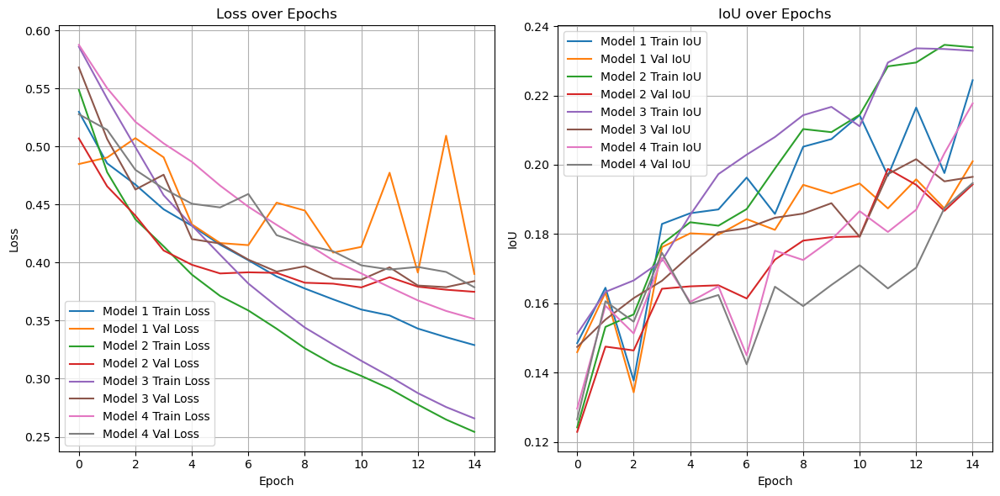

In [29]:
results(model_1_train_loss, model_1_val_loss, model_1_train_iou, model_1_val_iou,
        model_2_train_loss, model_2_val_loss, model_2_train_iou, model_2_val_iou,
        model_3_train_loss, model_3_val_loss, model_3_train_iou, model_3_val_iou,
        model_4_train_loss, model_4_val_loss, model_4_train_iou, model_4_val_iou)

### Смотрим результаты

Посмотрим, как модели генерируют на валидационной выборке

In [30]:
def visualize_voxel(voxel_tensor):
    voxel = voxel_tensor.squeeze().cpu().numpy()
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.voxels(voxel > 0.5, edgecolor="k")
    plt.show()

def visualize(model, dataset):
    for i in range(5):
        image, voxels = dataset[i]
        plt.imshow(image.permute(1, 2, 0))  # channels last
        plt.title("2D Изображение")
        plt.axis("off")
        plt.show()

        visualize_voxel(voxels)

        # Вывод одного примера
        model.eval()
        image, _ = dataset[i]
        with torch.no_grad():
            pred_vox = model(image.unsqueeze(0).to(device)).squeeze()
        visualize_voxel(pred_vox)

#### Model 1

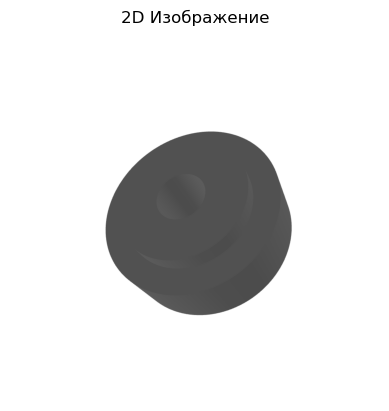

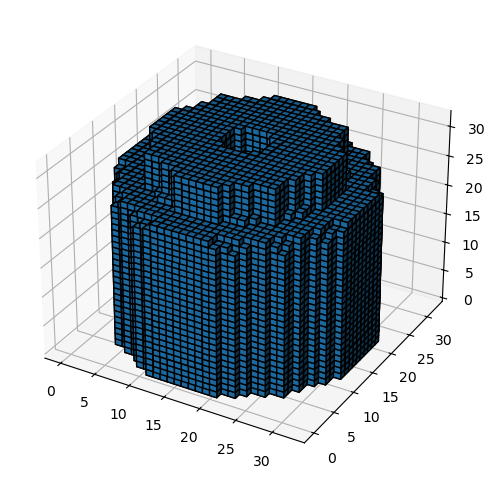

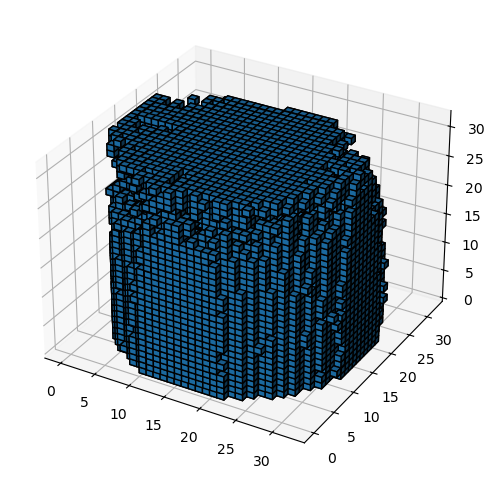

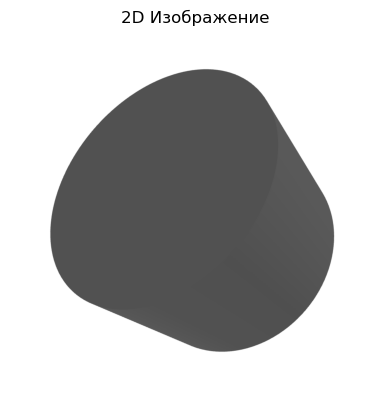

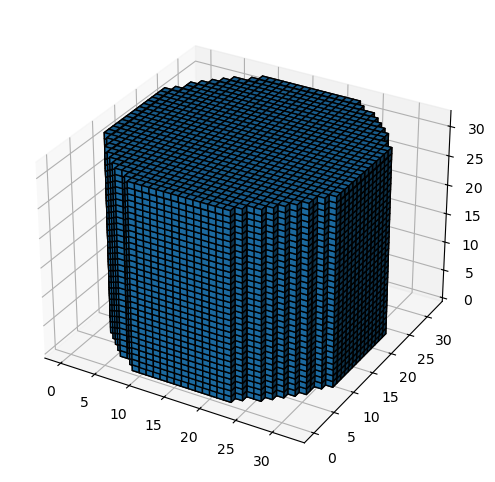

...

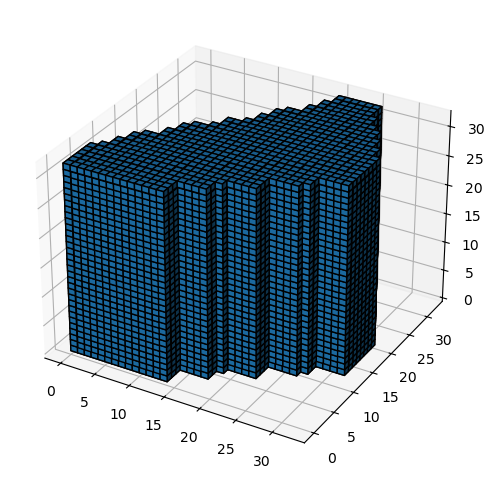

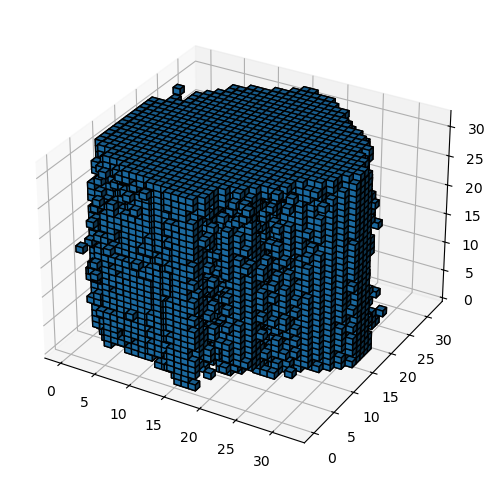

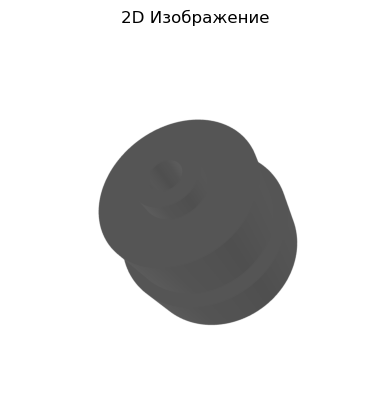

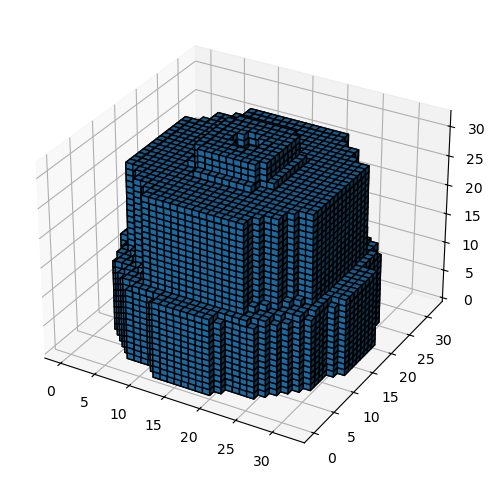

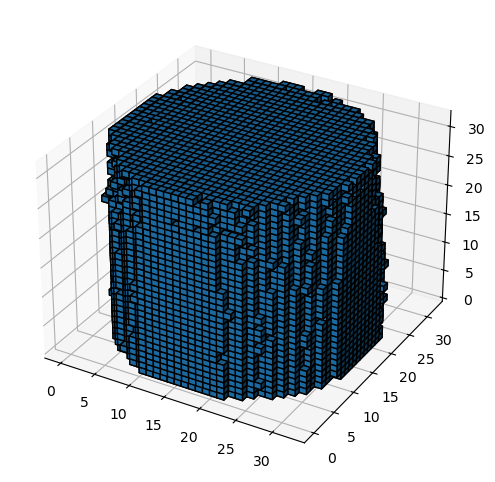

In [31]:
model_1.load_state_dict(torch.load('best_model_1.pt'))
visualize(model_1, val_dataset)

#### Model 2

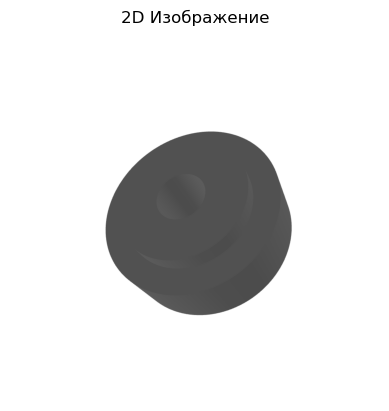

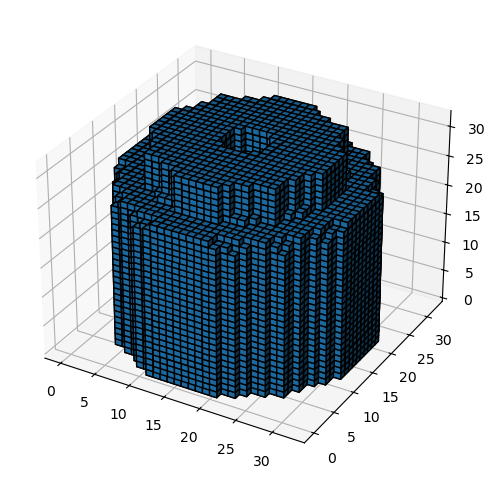

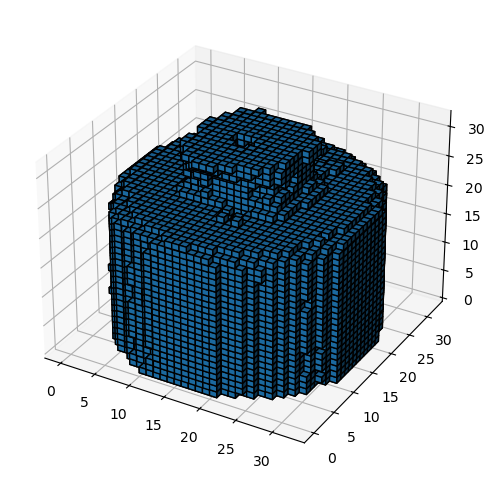

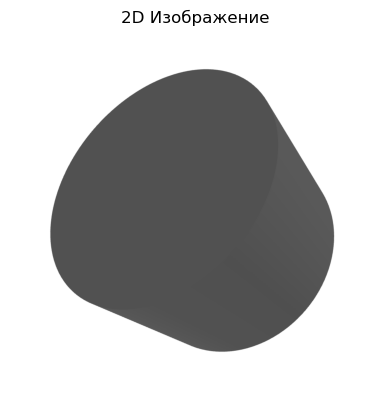

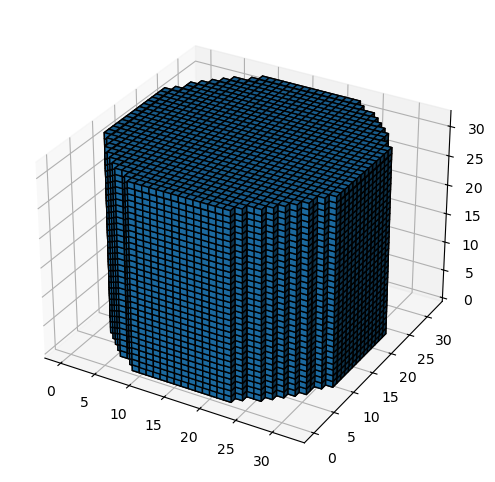

...

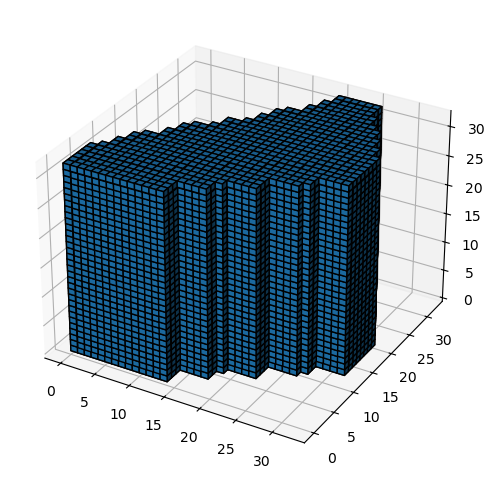

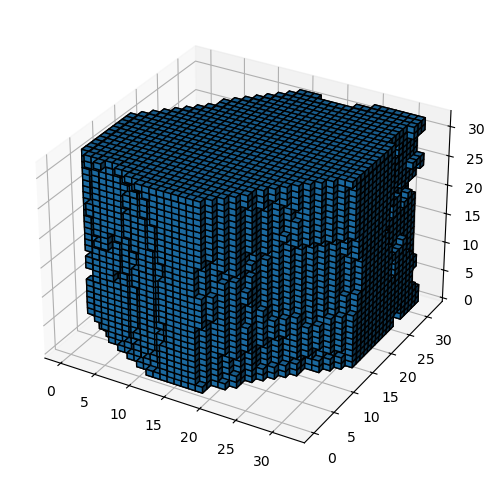

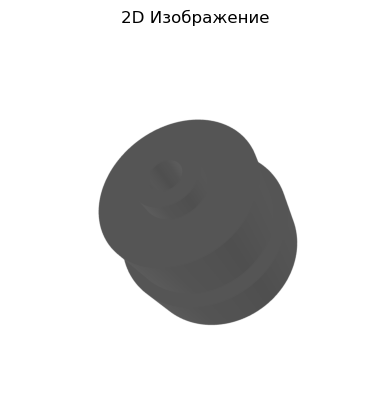

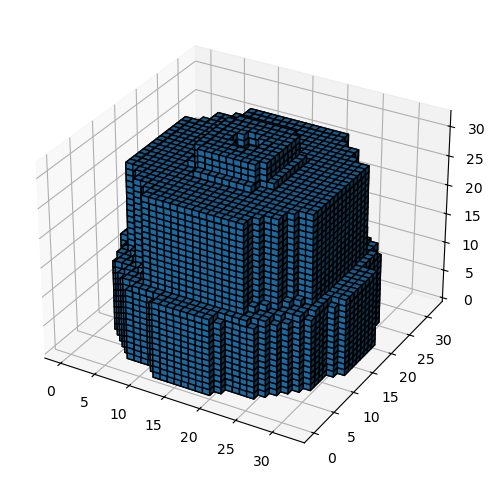

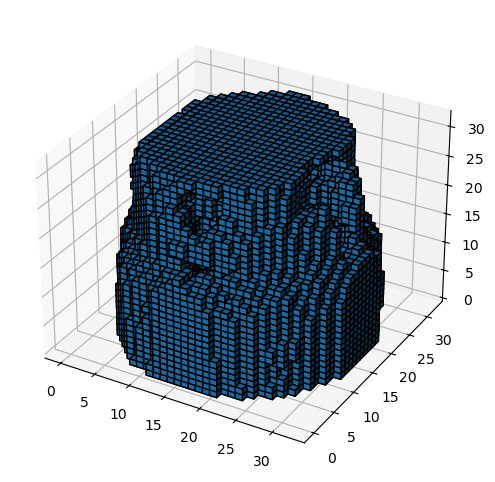

In [32]:
model_2.load_state_dict(torch.load('best_model_2.pt'))
visualize(model_2, val_dataset)

#### Model 3

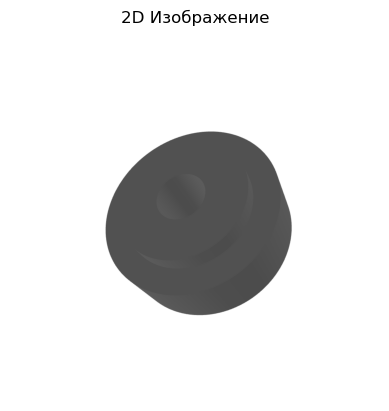

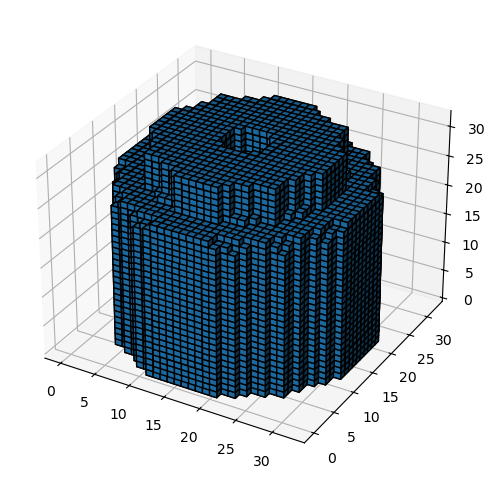

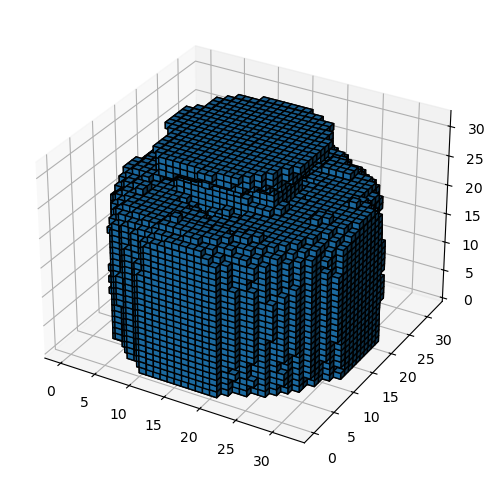

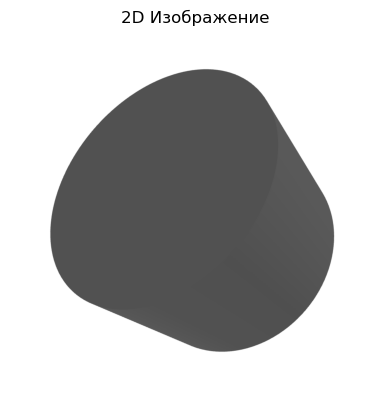

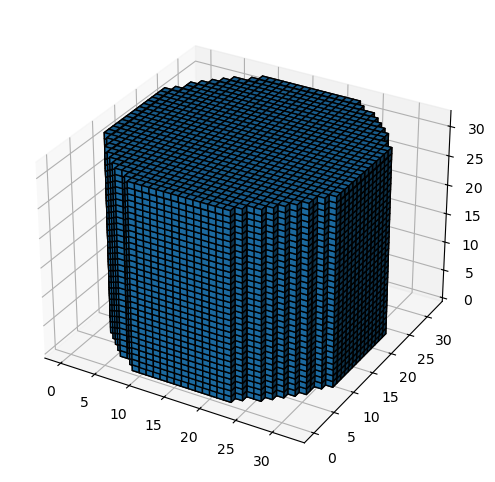

...

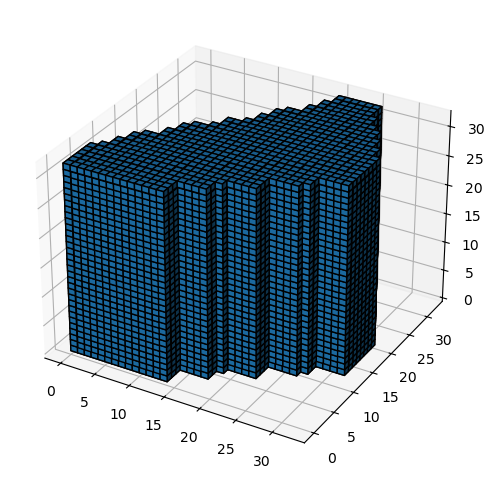

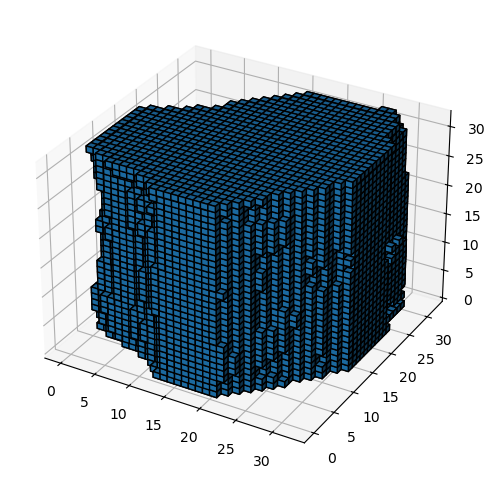

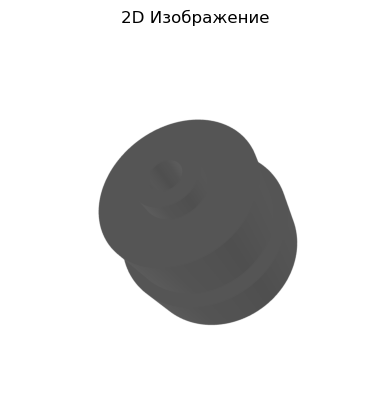

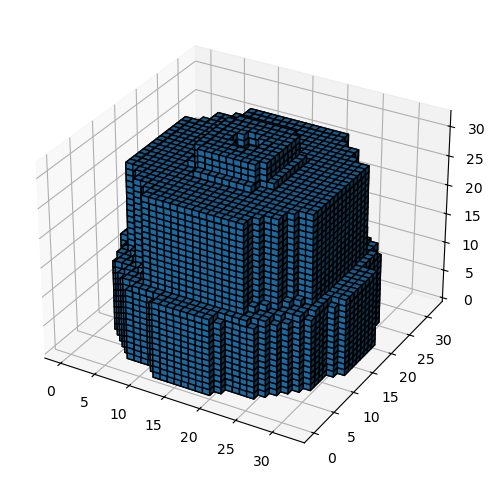

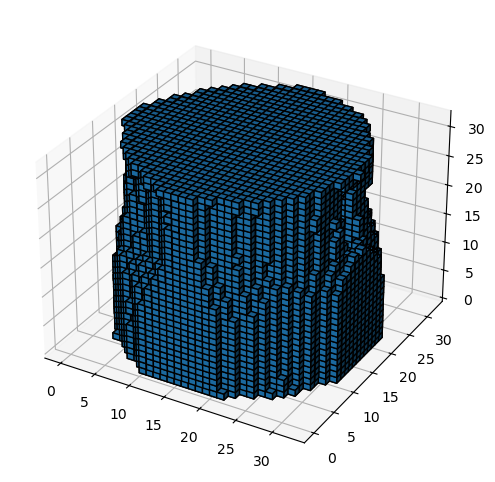

In [33]:
model_3.load_state_dict(torch.load('best_model_3.pt'))
visualize(model_3, val_dataset)

#### Model 4

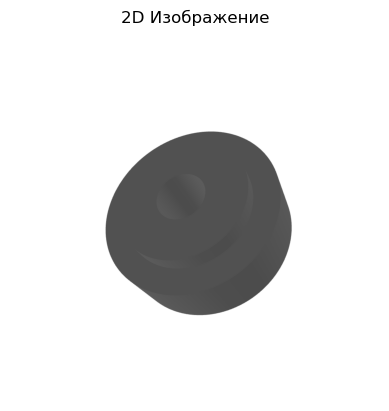

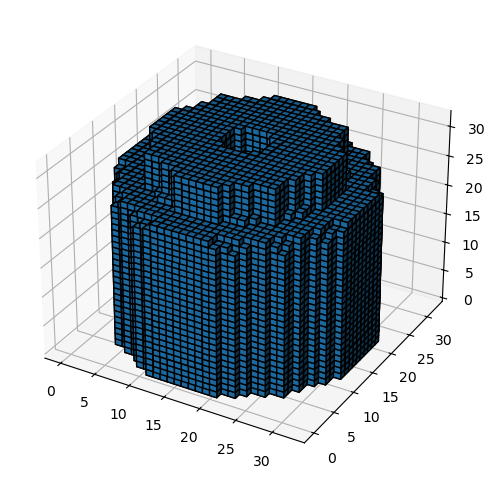

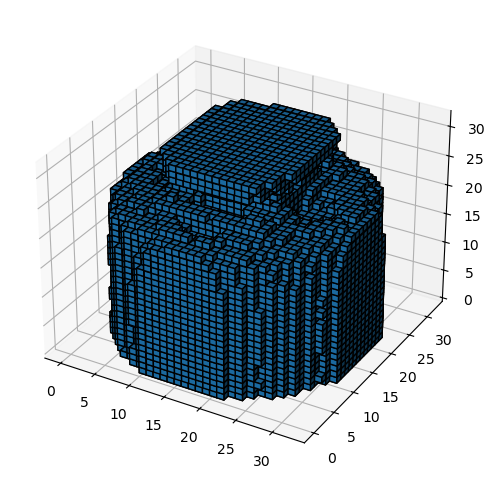

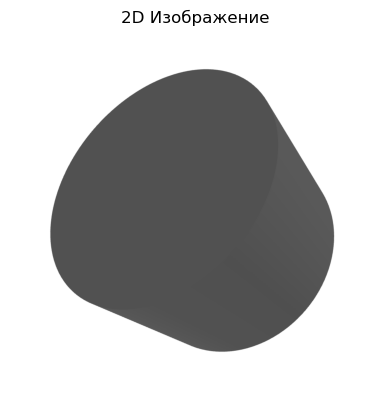

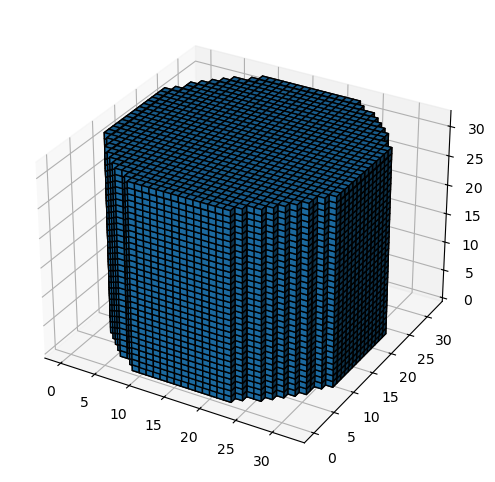

...

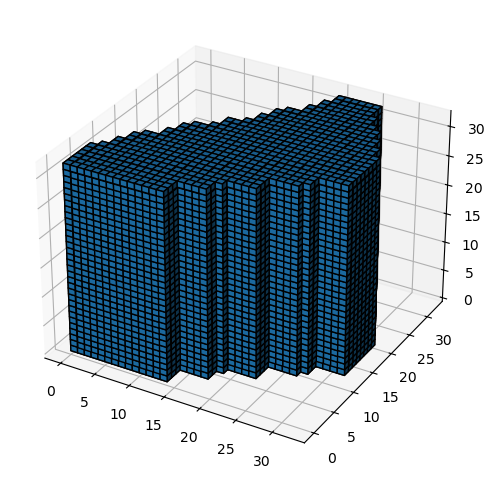

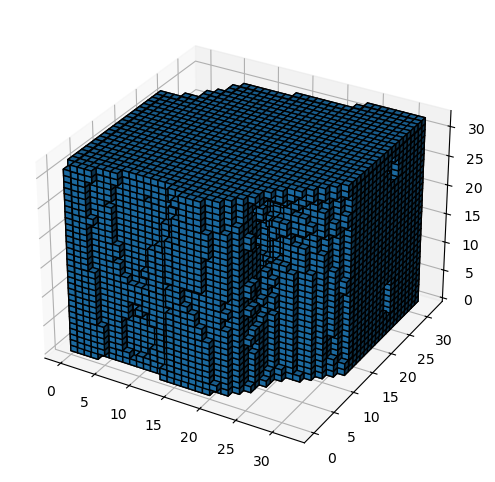

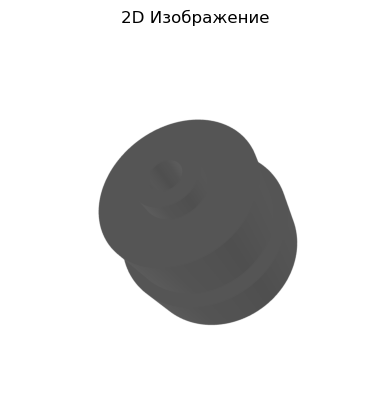

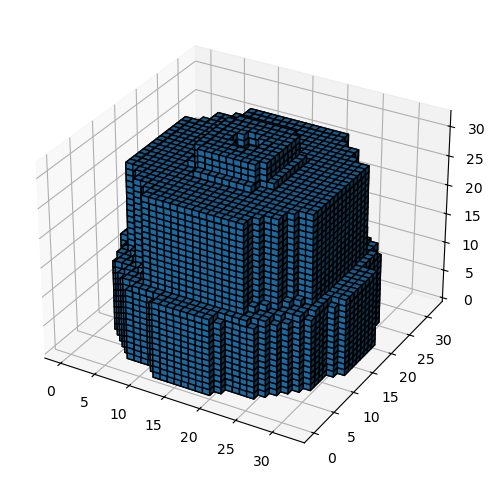

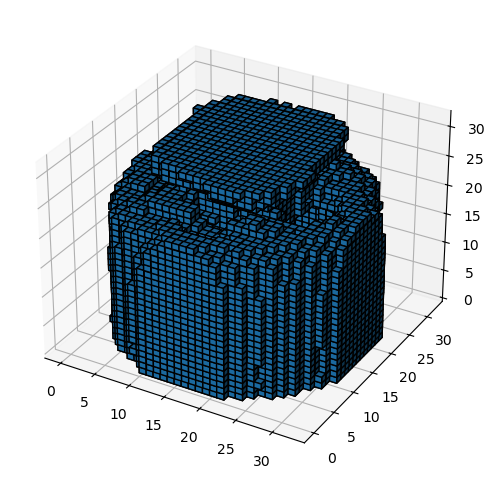

In [34]:
model_4.load_state_dict(torch.load('best_model_4.pt'))
visualize(model_4, val_dataset)